# Distortion Correction

## Find camera calibration points

In [2]:
import numpy as np
import pickle
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [3]:
# prepare object points
nx = 9
ny = 6

# Make a list of calibration images
files = glob.glob('camera_cal/calibration*.jpg')

objpoints = []
imgpoints = []

objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

for file in files:
    img = cv2.imread(file)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

## Get camera matrix from given image and object points

In [9]:
ret, mtx, dist, rves, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

with open('camera_matrix.pkl', 'wb') as file:
    data = [mtx, dist]
    pickle.dump(data, file)

## Apply Distortion Correction to checkboard images

In [1]:
from image_functions import cal_undistort

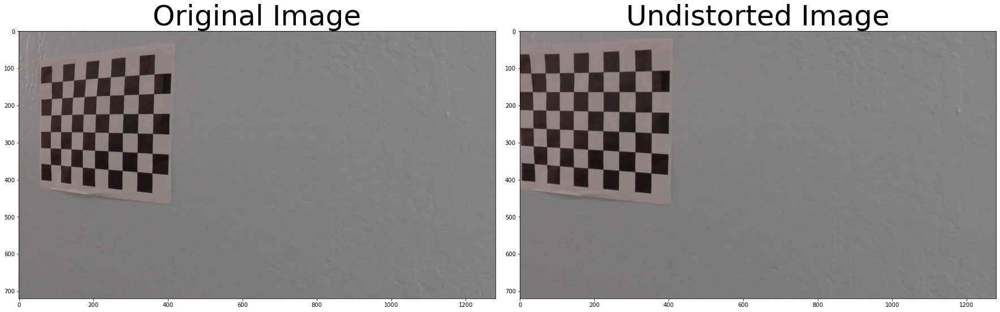

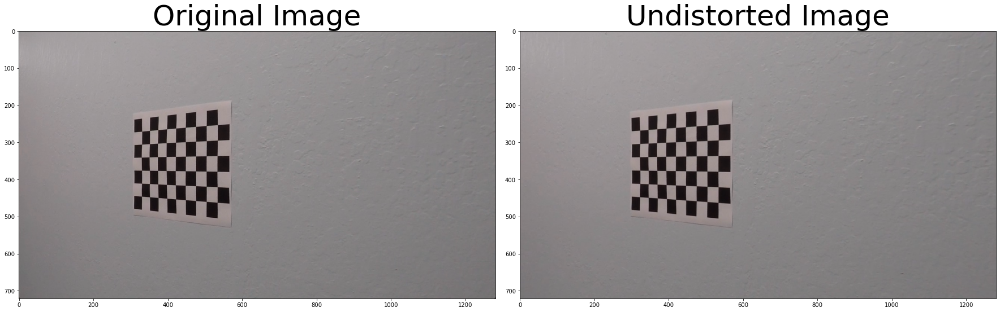

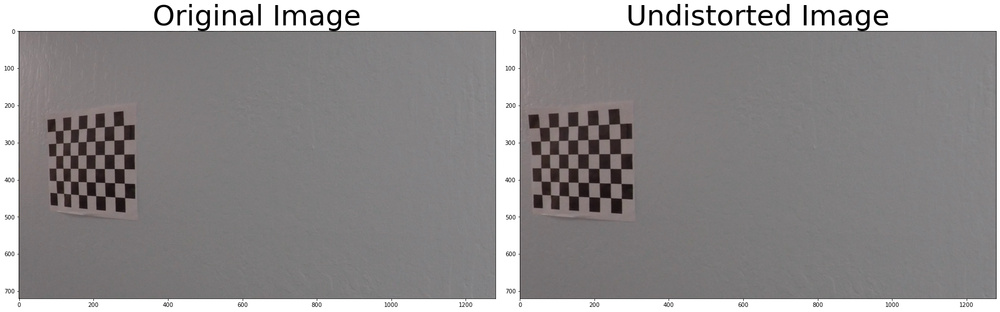

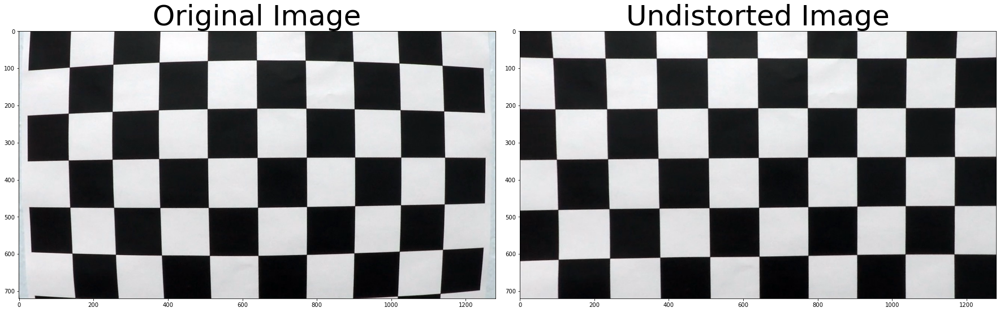

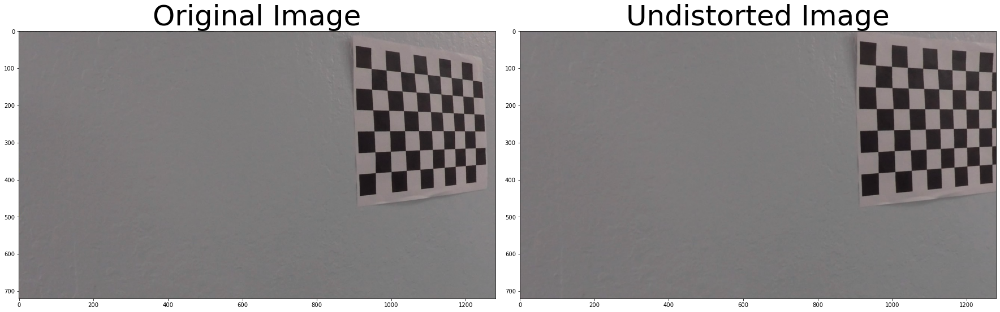

...

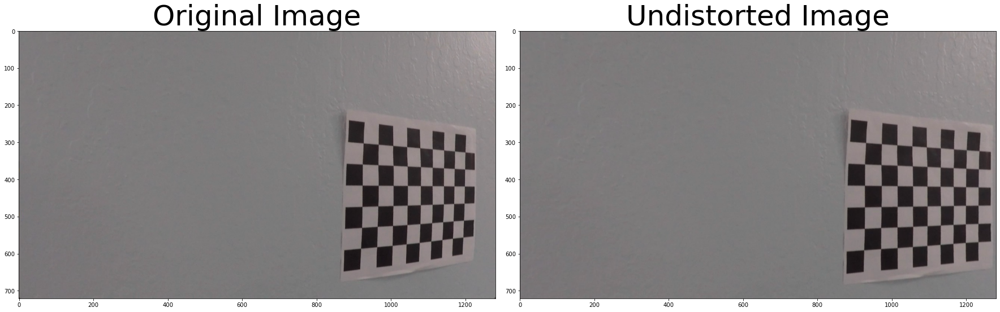

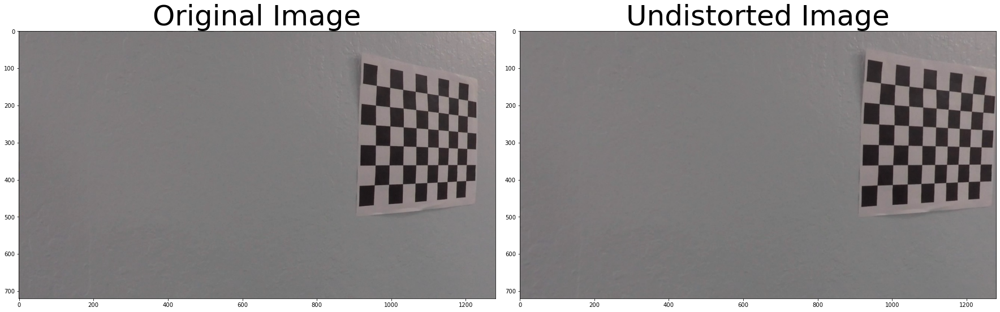

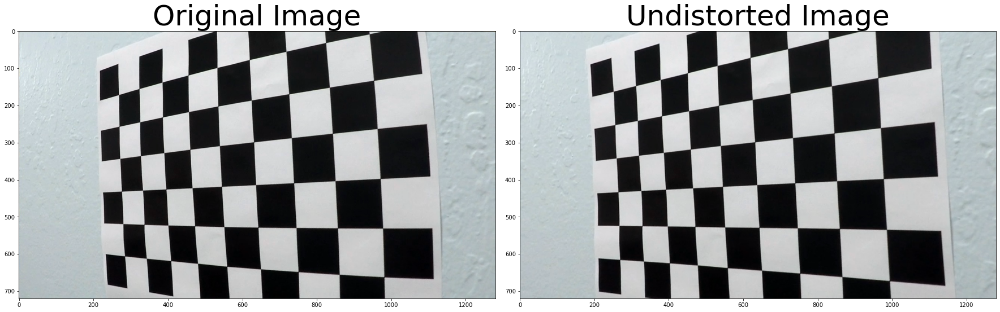

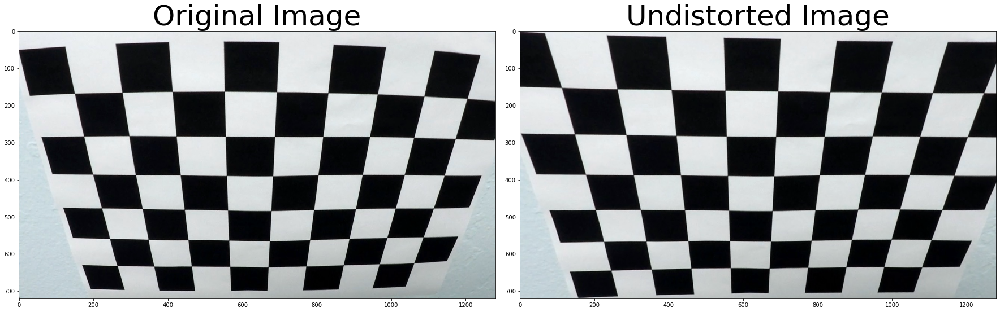

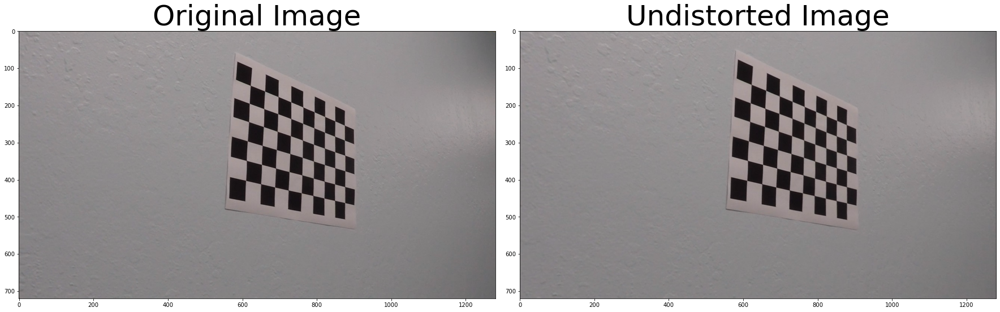

In [7]:
# undistort
for file in files:
    img = cv2.imread(file)
    undistorted = cal_undistort(img, mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    basename = os.path.splitext(os.path.basename(file))[0]
    output_filename = 'output_images/{0}.png'.format(basename)
    plt.savefig(output_filename)